In [538]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr


In [539]:
BankData = pd.read_excel("BankData.xlsx")
BankData

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [540]:
BankData.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [541]:
BankData.describe() #returns description of the data

,age,balance,day,duration,campaign,pdays,previous
count,"45,211.00","45,211.00","45,211.00","45,211.00","45,211.00","45,211.00","45,211.00"
mean,40.94,"1,362.27",15.81,258.16,2.76,40.20,0.58
std,10.62,"3,044.77",8.32,257.53,3.10,100.13,2.30
min,18.00,"-8,019.00",1.00,0.00,1.00,-1.00,0.00
25%,33.00,72.00,8.00,103.00,1.00,-1.00,0.00
50%,39.00,448.00,16.00,180.00,2.00,-1.00,0.00
75%,48.00,"1,428.00",21.00,319.00,3.00,-1.00,0.00
max,95.00,"102,127.00",31.00,"4,918.00",63.00,871.00,275.00


In [542]:
pd.options.display.float_format = '{:,.2f}'.format

In [543]:
BankData.shape

(45211, 17)

In [544]:
BankData.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [545]:
BankData.isnull().sum() # NO NULL VALUES PRESENT IN THE DATA

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [546]:
BankData.shape  #SHAPE OF THE DATA

(45211, 17)

In [547]:
BankData.corr()

<ipython-input-547-aa2b3083dea0>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,age,balance,day,duration,campaign,pdays,previous
age,1.00,0.10,-0.01,-0.00,0.00,-0.02,0.00
balance,0.10,1.00,0.00,0.02,-0.01,0.00,0.02
day,-0.01,0.00,1.00,-0.03,0.16,-0.09,-0.05
duration,-0.00,0.02,-0.03,1.00,-0.08,-0.00,0.00
campaign,0.00,-0.01,0.16,-0.08,1.00,-0.09,-0.03
pdays,-0.02,0.00,-0.09,-0.00,-0.09,1.00,0.45
previous,0.00,0.02,-0.05,0.00,-0.03,0.45,1.00


Identify data imbalanced (large number of the records represent a majority class and very few records represent the minority class)

Positive responses: 11.70% (5289)
Negative responses: 88.30% (39922)


<Axes: xlabel='y', ylabel='count'>

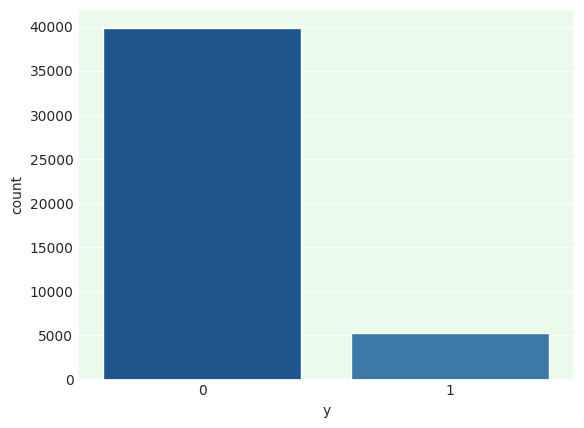

In [548]:
BankData['y'] = BankData['y'].apply(lambda x: 1 if x == 'yes' else 0)

pos_count = BankData['y'].sum()
neg_count = len(BankData) - pos_count

pos_percent = pos_count / len(BankData) * 100
neg_percent = neg_count / len(BankData) * 100

print('Positive responses: {:.2f}% ({})'.format(pos_percent, pos_count))
print('Negative responses: {:.2f}% ({})'.format(neg_percent, neg_count))
sns.countplot(x='y', data=BankData)

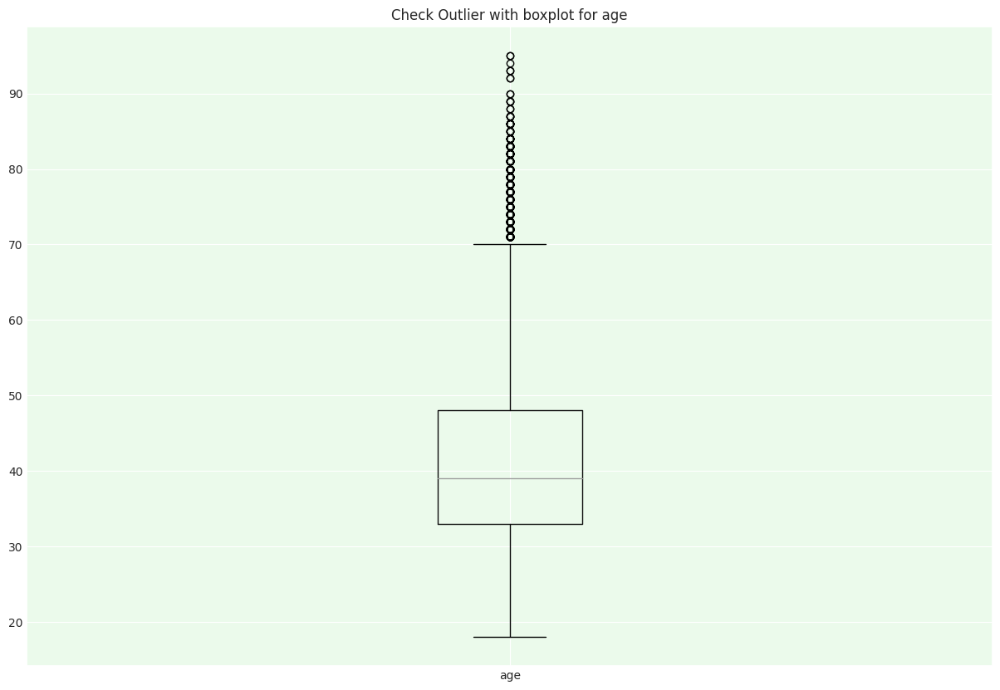

In [549]:
#CHECKING FOR THE ANY OUTLIER PRESENT IN THE AGE 

plt.figure(figsize=(15,10))
plt.title("Check Outlier with boxplot for age")
BankData.boxplot(column=['age']);

<Figure size 2000x1000 with 0 Axes>

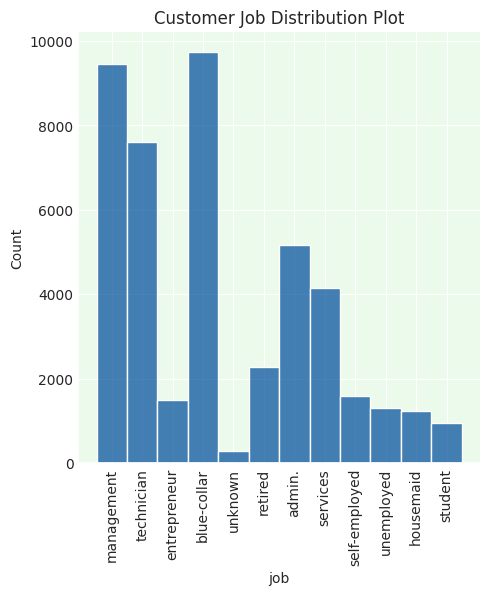

In [550]:
plt.figure(figsize=[20,10])
chart=sns.displot(BankData['job'])
plt.title('Customer Job Distribution Plot')
chart.set_xticklabels(rotation=90)

Text(0.5, 1.0, 'Loan Pie Chart')

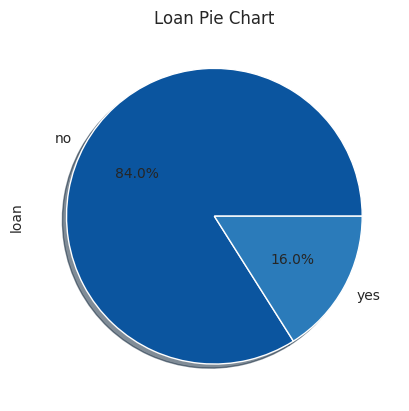

In [551]:
#Display the percent value of Loan Taken Yes or No only by the Customer

BankData['loan'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True) 
plt.title("Loan Pie Chart")

<Axes: ylabel='age'>

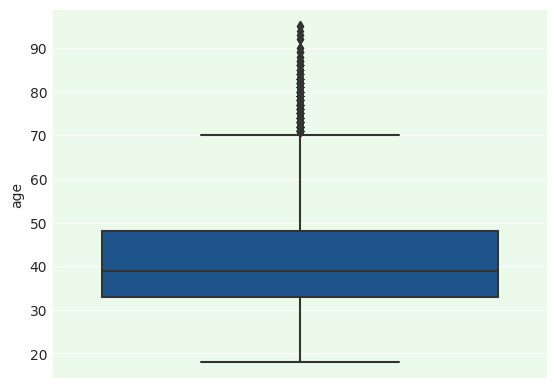

In [552]:
import seaborn as sns
sns.boxplot(y='age',data=BankData)

<Axes: title={'center': 'Education of the Customer'}, xlabel='education', ylabel='count'>

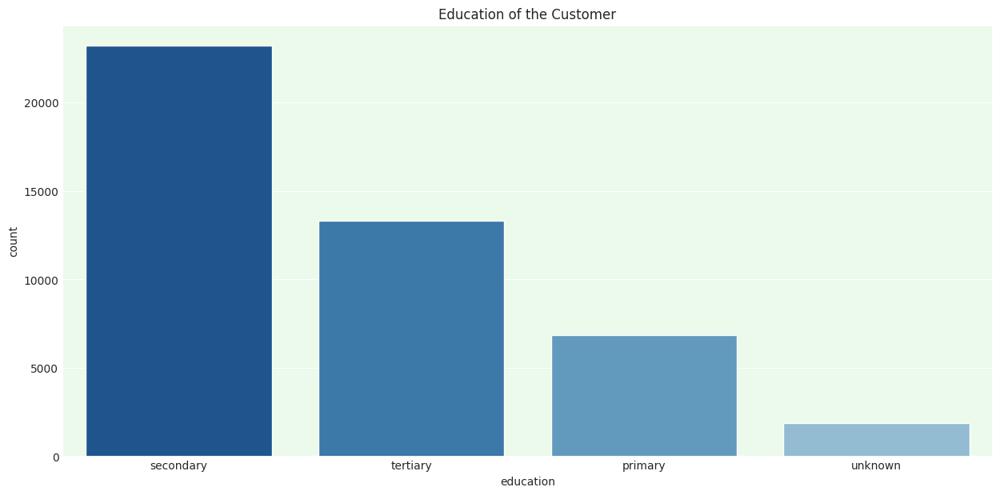

In [553]:
plt.figure(figsize=(15,7))
plt.title("Education of the Customer")
order = BankData['education'].value_counts(ascending=False).index 
sns.countplot(x='education', data=BankData, order=order)

<Axes: title={'center': 'JobType of Subscribed Customers'}, xlabel='job', ylabel='count'>

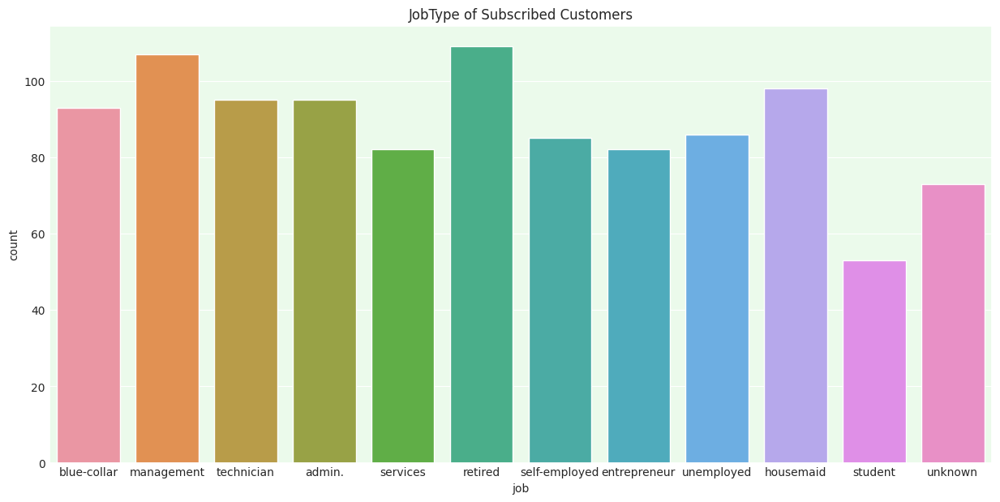

In [554]:
response_df = BankData[['age', 'job', 'y']]
grouped_df = response_df.groupby(['age', 'job', 'y']).size().reset_index(name='count')
yes_responses_df = grouped_df[grouped_df['y'] == 'yes']
sorted_df = yes_responses_df.sort_values(['job', 'count'], ascending=[True, False])


plt.figure(figsize=(15,7))
plt.title("JobType of Subscribed Customers")
order = BankData['job'].value_counts(ascending=False).index 
sns.countplot(x='job', data=grouped_df, order=order)

<ipython-input-555-d4a0540296eb>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



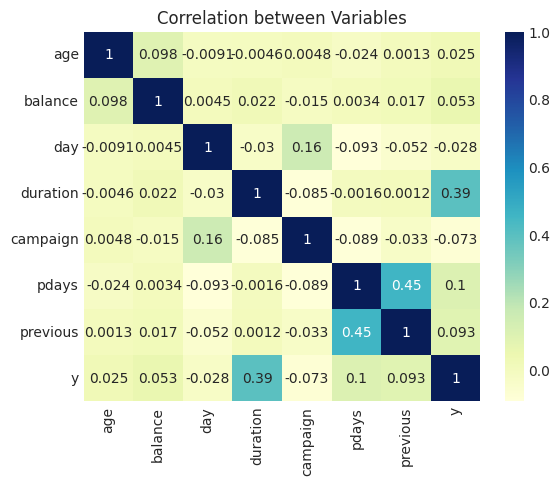

In [555]:
sns.heatmap(BankData.corr(), annot=True, cmap="YlGnBu")
plt.title("Correlation between Variables")
plt.show()

<ipython-input-556-657df13a6f72>:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

<ipython-input-556-657df13a6f72>:6: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



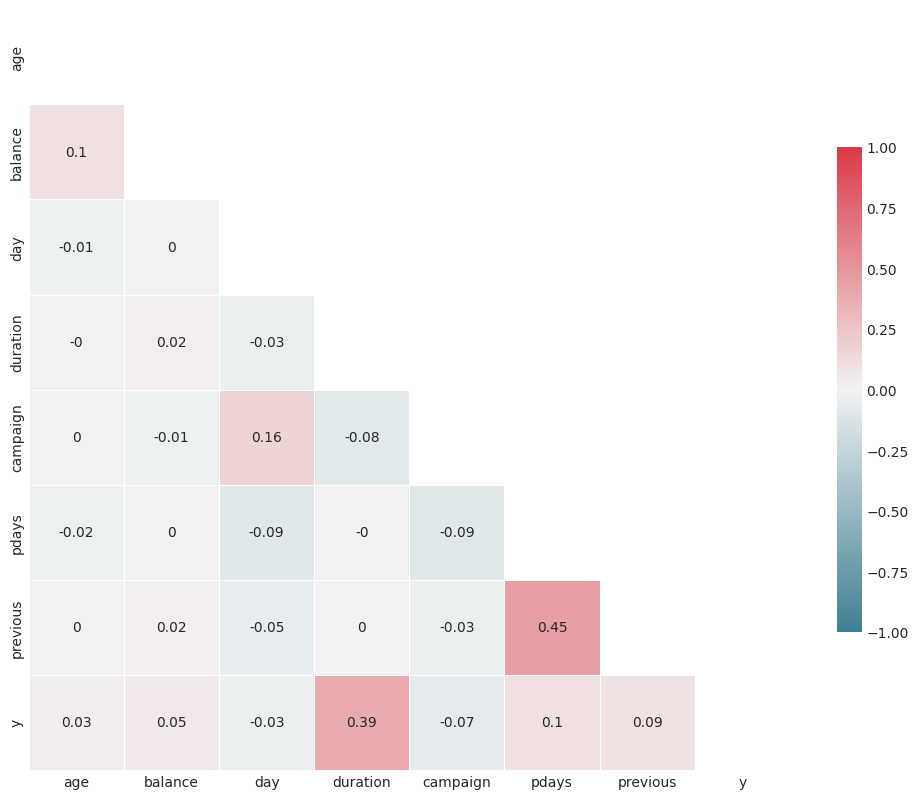

In [556]:
sns.set_style("white")
# Generate and visualize the correlation matrix
corr = BankData.corr().round(2)

# Mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set figure size
f, ax = plt.subplots(figsize=(10, 10))

# Define custom colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.tight_layout()

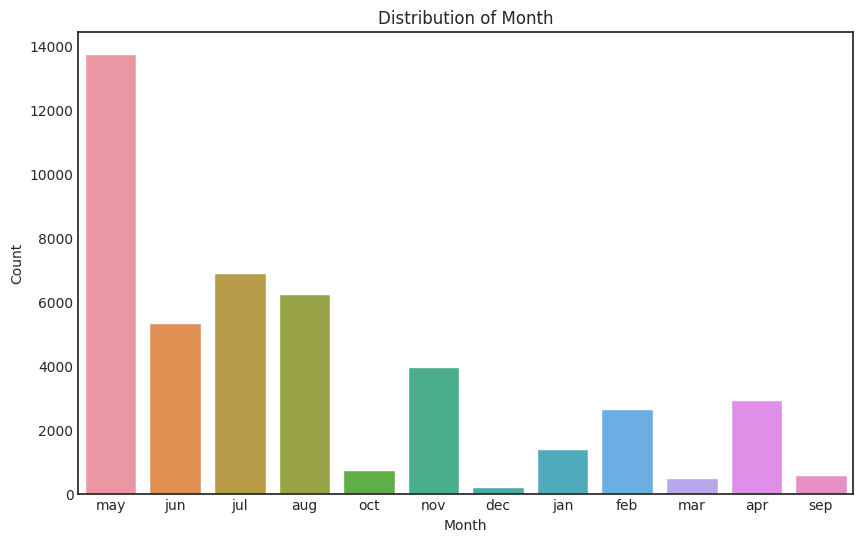

In [557]:
# Bar chart of month
plt.figure(figsize=(10, 6))
sns.countplot(x='month', data=BankData)
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Distribution of Month')
plt.show()

## **DATA** **CLEANING**

---



In [558]:
print(BankData.head())

   age           job  marital  education default  balance housing loan  \
0   58    management  married   tertiary      no     2143     yes   no   
1   44    technician   single  secondary      no       29     yes   no   
2   33  entrepreneur  married  secondary      no        2     yes  yes   
3   47   blue-collar  married    unknown      no     1506     yes   no   
4   33       unknown   single    unknown      no        1      no   no   

   contact  day month  duration  campaign  pdays  previous poutcome  y  
0  unknown    5   may       261         1     -1         0  unknown  0  
1  unknown    5   may       151         1     -1         0  unknown  0  
2  unknown    5   may        76         1     -1         0  unknown  0  
3  unknown    5   may        92         1     -1         0  unknown  0  
4  unknown    5   may       198         1     -1         0  unknown  0  


In [559]:
# Drop unnecessary columns "default, loan, contact, day"
BankData = BankData.drop(['default', 'loan', 'contact', 'day'], axis=1)

In [560]:
# Rename the target variable column
BankData = BankData.rename(columns={'y': 'target'})

# Check for missing values in the target column
BankData['target'].isnull().sum()  # There are no missing values

# Replace NaN values with 0 and the rest with 1
BankData['target'] = BankData['target'].fillna(0)
BankData['target'] = BankData['target'].replace('yes', 1)


<Axes: >

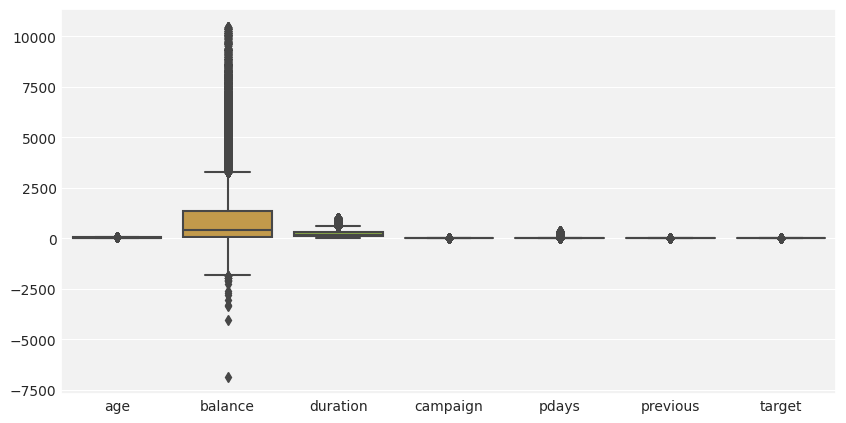

In [561]:
from seaborn.categorical import boxplot
# Set the background color
sns.set_style("darkgrid", {"axes.facecolor": "#f2f2f2"})
# Handle outliers
z_scores = stats.zscore(BankData[['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']])
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
B1 = BankData[filtered_entries]
plt.figure(figsize=(10, 5))
boxplot(B1)

In [562]:
# Remove rows with negative balance
BankData = BankData[BankData['balance'] > 0]

<Axes: >

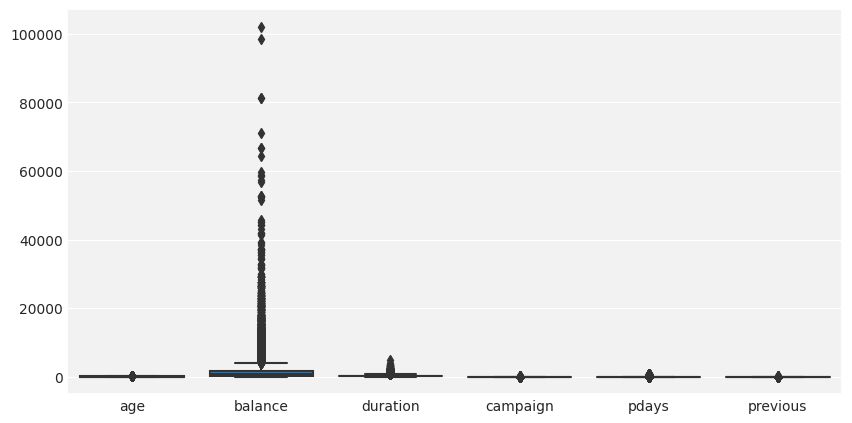

In [563]:
# Set the background color
sns.set_style("darkgrid", {"axes.facecolor": "#f2f2f2"})
plt.figure(figsize=(10, 5))
boxplot(BankData[['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']])

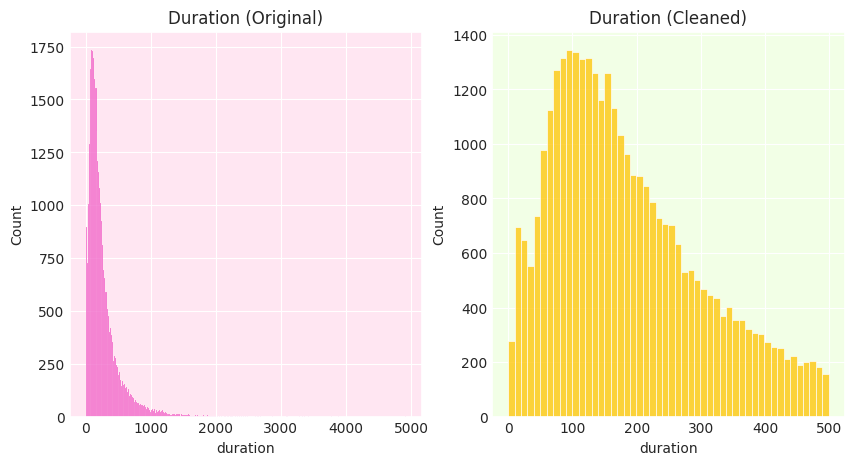

In [564]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the color palette
palette = sns.color_palette("bright")

# Create the figure and the subplots
fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

# Plot the original data in the left subplot
sns.histplot(BankData['duration'], color=palette[6], ax=axs[0])
axs[0].set_title("Duration (Original)")
axs[0].set_facecolor('#ffe6f2')

# Remove rows with negative balance
BankData = BankData[BankData['duration'] < 500]

# Plot the cleaned data in the right subplot
sns.histplot(BankData['duration'],color=palette[8], ax=axs[1])
axs[1].set_title("Duration (Cleaned)")
axs[1].set_facecolor('#f2ffe6')

plt.show()

Text(0.5, 1.0, 'Age Distribution (Cleaned)')

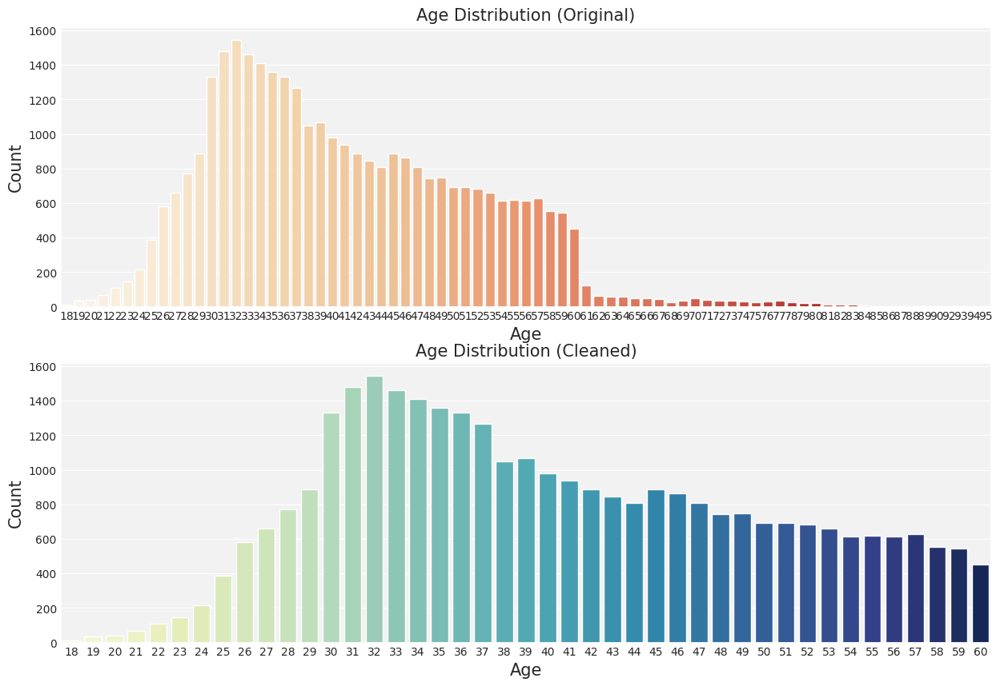

In [565]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the background color
sns.set_style("darkgrid", {"axes.facecolor": "#f2f2f2"})

# Create the figure and the subplots
fig, axs = plt.subplots(nrows=2, figsize=(15, 10))

# Plot the original data in the top subplot
sns.countplot(x='age', palette="OrRd", data=BankData, ax=axs[0])
axs[0].set_xlabel("Age", fontsize=15)
axs[0].set_ylabel("Count", fontsize=15)
axs[0].set_title("Age Distribution (Original)", fontsize=15)

# Remove outliers for age column above 60
BankData = BankData[BankData['age'] <= 60]

# Plot the cleaned data in the bottom subplot
sns.countplot(x='age', palette="YlGnBu", data=BankData, ax=axs[1])
axs[1].set_xlabel("Age", fontsize=15)
axs[1].set_ylabel("Count", fontsize=15)
axs[1].set_title("Age Distribution (Cleaned)", fontsize=15)

<ipython-input-566-8eb379ee3ee0>:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



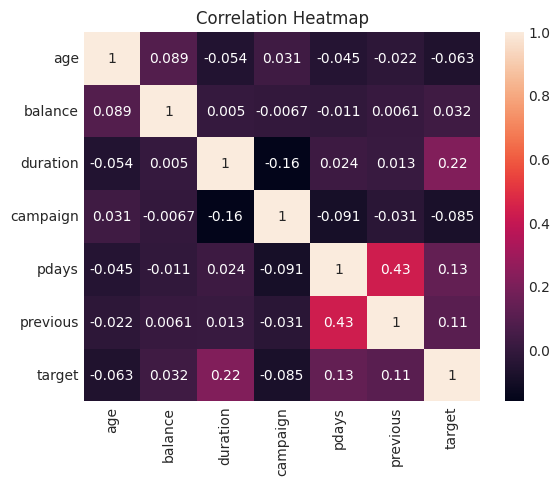

<Figure size 1000x1000 with 0 Axes>

In [566]:
import seaborn as sns
sns.set_style("darkgrid", {"axes.facecolor": "#E5E8E8"})
corr_matrix = BankData.corr()
sns.heatmap(corr_matrix, annot=True)
plt.title('Correlation Heatmap')
plt.figure(figsize=(10, 10))
plt.show()

In [567]:
print(BankData.head())

   age           job  marital  education  balance housing month  duration  \
0   58    management  married   tertiary     2143     yes   may       261   
1   44    technician   single  secondary       29     yes   may       151   
2   33  entrepreneur  married  secondary        2     yes   may        76   
3   47   blue-collar  married    unknown     1506     yes   may        92   
4   33       unknown   single    unknown        1      no   may       198   

   campaign  pdays  previous poutcome  target  
0         1     -1         0  unknown       0  
1         1     -1         0  unknown       0  
2         1     -1         0  unknown       0  
3         1     -1         0  unknown       0  
4         1     -1         0  unknown       0  


# **VISUALIZATION**

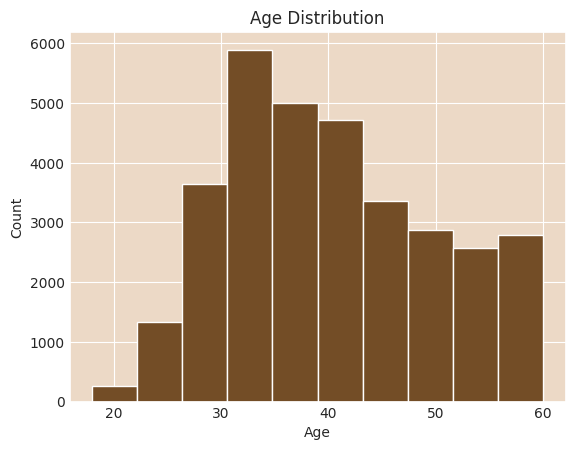

In [568]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid", {"axes.facecolor": "#ecd9c6"})
plt.hist(BankData['age'], bins=10, color='#734d26')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

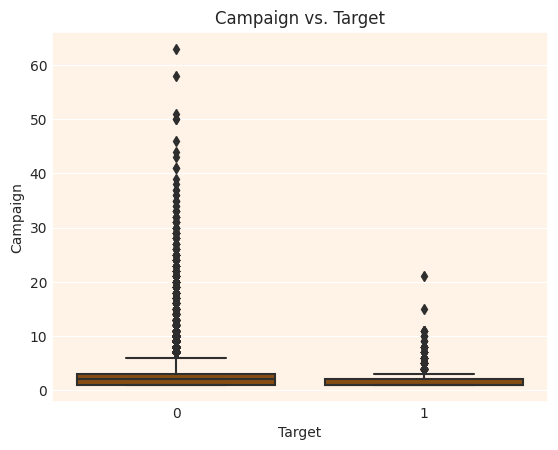

In [569]:
#Shows who has subscribed the campaign and not subcribed
import seaborn as sns
sns.set_style("darkgrid", {"axes.facecolor": "#fff2e6"})
sns.boxplot(x=BankData['target'], y=BankData['campaign'],color='#994d00')
plt.title('Campaign vs. Target')
plt.xlabel('Target')
plt.ylabel('Campaign')
plt.show()

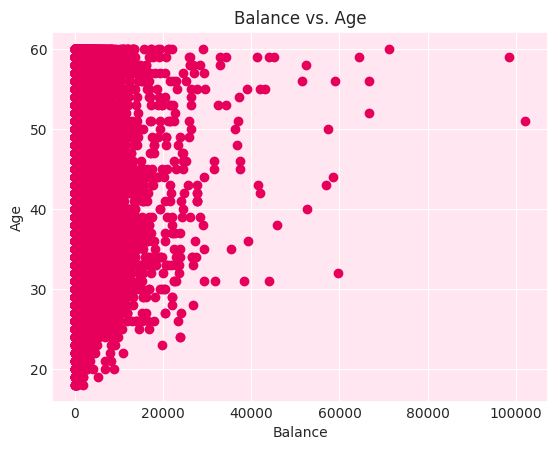

In [579]:
#Shows What age people have more balance
import matplotlib.pyplot as plt
sns.set_style("darkgrid", {"axes.facecolor": "#ffe6f0"})
plt.scatter(BankData['balance'], BankData['age'],color='#e6005c')
plt.title('Balance vs. Age')
plt.xlabel('Balance')
plt.ylabel('Age')
plt.show()

In [571]:
import plotly.express as px

fig = px.scatter(BankData, x='age', y='duration', color='target', animation_frame='month')
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [572]:
import plotly.express as px

fig = px.scatter(BankData, x='age', y='duration', color='target', animation_frame='month',
                 color_continuous_scale='magma')
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [573]:
import plotly.express as px
import pandas as pd
fig = px.bar(BankData, x="marital", y="balance", animation_frame="age", color="target")
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [574]:
import plotly.express as px

fig = px.sunburst(BankData, path=['marital', 'education', 'job'], values='balance', color="target")
fig.update_layout(
    sliders=[
        dict(
            active=0,
            steps=[dict(label=str(age), method="update", args=[{"visible": [i == age for i in BankData['age']]}]) for age in BankData['age'].unique()],
            transition={'duration': 500},
            x=0.1, y=0, len=0.9, pad={"t": 50, "b": 10},
        )
    ]
)
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()


In [575]:
import plotly.express as px

fig = px.scatter(BankData, x="duration", y="balance", color="target", animation_frame="age", 
                 range_x=[0, BankData["duration"].max()+10], range_y=[0, BankData["balance"].max()+1000])
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()


In [576]:
import plotly.express as px
import pandas as pd
fig = px.scatter(BankData, x="duration", y="campaign", animation_frame="age", size="balance", color="target")
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [577]:
fig = px.scatter(BankData, x="balance", y="pdays", color="target", animation_frame="marital", size="campaign", hover_data=['job'])
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [578]:
fig = px.area(BankData, x="month", y="balance", color="target", animation_frame="age")
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()